<center><h2>Welcome to Rwanda Carbon Prediction Challenge</h2></center>
<figure>
<!-- <center><img src ="https://drive.google.com/uc?export=view&id=1hSOAfRhJ_jo-MZAjq81VYJu5bZNL7EjD" width = "800" height = '500'/> -->

*About the problem*
> The ability to accurately monitor carbon emissions is a critical step in the fight against climate change. Precise carbon readings allow researchers and governments to understand the sources and patterns of carbon mass output. While Europe and North America have extensive systems in place to monitor carbon emissions on the ground, there are few available in Africa.

*Objective of this challenge*
> The objective of this challenge is to create machine learning or a deep learning model using open-source CO2 emissions data (from Sentinel-5P satellite observations) to predict carbon emissions.

These solutions will enable governments and other actors to estimate carbon emission levels across Africa, even in places where on-the-ground monitoring is not possible.



co2-emission  images1  playground-series-s3e20


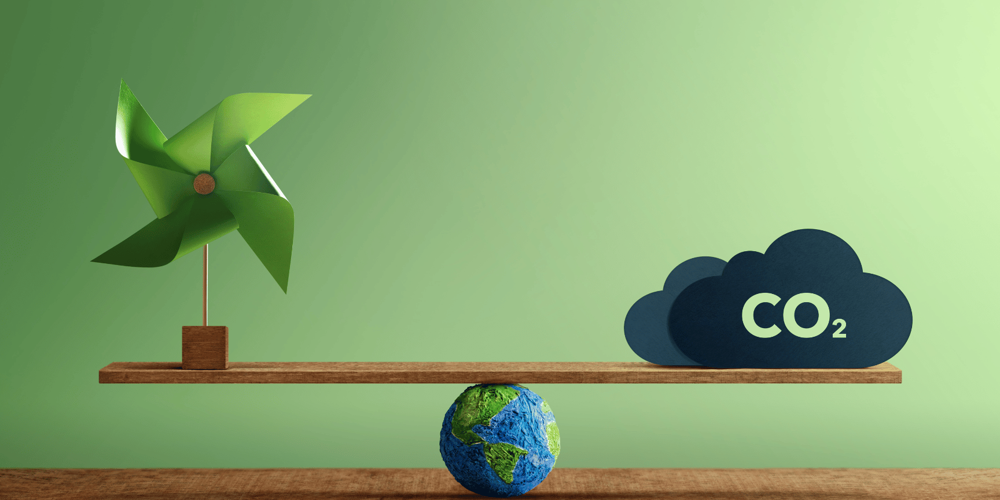

In [1]:
from IPython.display import Image
import os
!ls ../input/
Image("/kaggle/input/images1/co2_emissions_banner.png")

<b> Author: </b> Tony Hollaar
<br>
<b> Date: </b> 08/20/2023
<br>
<b> Description </b> Predicting 2022 week 0 through week 48 for 497 locations CO2 Emissions.
<br>
<b> Models utilized: </b>
- <b> Naive Model </b>
    - Method: Taking yearly lag (53 week lag of 2021 data for week 0 through week 48)
    - Leaderboard Score RMSE: 210
- <b> Random Forest </b>
- <b> XGBoost </b>
    - Leaderboard Score RMSE: 177
- <b> Prophet </b>
    - Leaderboard Score RMSE: 33
- <b> LSTM </b>
    

<div style="background-color: #9ac189; border-radius: 10px; padding: 15px;">
  <h1 style="color: white; margin: 0; padding: 5px;">Table of contents:</h1>
</div>

1. [Importing libraries](#Libraries)
2. [Loading data](#Data)
3. [EDA](#EDA)
4. [Preprocess](#Preprocess)
5. [Feature engineering](#Engineering)
6. [Feature Importance](#Feature_Importance)
7. [Modeling](#Modelling)
    - [Baseline Model - yearly lag](#Baseline)
    - [XGBOOST](#XGBoost)
        - [Hyperparameter Tuning with Optuna Package](#Optuna)
    - [Prophet](#Prophet)
        - [Plot Forecast](#Plot)

### <a name="Libraries"></a>
<div style="background-color: #9ac189; border-radius: 10px; padding: 15px;">
  <h1 style="color: white; margin: 0; padding: 5px;">1. Importing libraries</h1>
</div>

In [2]:
# Import libraries
import pandas as pd
import numpy as np
import random
import os
from tqdm.notebook import tqdm

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
pd.options.display.float_format = '{:.5f}'.format
pd.options.display.max_rows = None

%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

import plotly.express as px
import missingno as msno

import plotly.io as pio
pio.renderers.default = 'notebook'

import matplotlib.pyplot as plt
import seaborn as sns

from prophet import Prophet
from prophet.diagnostics import cross_validation, performance_metrics
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, MaxAbsScaler, PowerTransformer, QuantileTransformer


In [3]:
# Set seed for reproducability
SEED = 2023
random.seed(SEED)
np.random.seed(SEED)

<a name="Data"></a>
<div style="background-color: #9ac189; border-radius: 10px; padding: 15px;">
  <h1 style="color: white; margin: 0; padding: 5px;">2. Loading and previewing data</h1>
</div>

In [4]:
DATA_PATH = '/kaggle/input/playground-series-s3e20'
# Load files
train = pd.read_csv(os.path.join(DATA_PATH, 'train.csv'))
test = pd.read_csv(os.path.join(DATA_PATH, 'test.csv'))
samplesubmission = pd.read_csv(os.path.join(DATA_PATH, 'sample_submission.csv'))

In [5]:
# Preview train dataset
train.head()

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,...,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission
0,ID_-0.510_29.290_2019_00,-0.51000,29.29000,2019,0,-0.00011,0.60302,-0.00007,0.25567,-98.59389,...,3664.43622,61085.80957,2615.12048,15.56853,0.27229,-12.62899,35.63242,-138.78642,30.75214,3.75099
1,ID_-0.510_29.290_2019_01,-0.51000,29.29000,2019,1,0.00002,0.72821,0.00001,0.13099,16.59286,...,3651.19031,66969.47873,3174.57242,8.69060,0.25683,30.35938,39.55763,-145.18393,27.25178,4.02518
2,ID_-0.510_29.290_2019_02,-0.51000,29.29000,2019,2,0.00051,0.74820,0.00038,0.11002,72.79584,...,4216.98649,60068.89445,3516.28267,21.10341,0.25110,15.37788,30.40182,-142.51954,26.19330,4.23138
3,ID_-0.510_29.290_2019_03,-0.51000,29.29000,2019,3,NaN,NaN,NaN,NaN,NaN,...,5228.50774,51064.54734,4180.97332,15.38690,0.26204,-11.29340,24.38036,-132.66583,28.82915,4.30529
4,ID_-0.510_29.290_2019_04,-0.51000,29.29000,2019,4,-0.00008,0.67630,-0.00005,0.12116,4.12127,...,3980.59812,63751.12578,3355.71011,8.11469,0.23585,38.53226,37.39298,-141.50981,22.20461,4.34732


In [6]:
# Preview test dataset
test.head()

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,...,Cloud_cloud_top_pressure,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle
0,ID_-0.510_29.290_2022_00,-0.51000,29.29000,2022,0,NaN,NaN,NaN,NaN,NaN,...,36022.02734,8472.31348,41047.93750,7472.31348,7.93562,0.24077,-100.11379,33.69704,-133.04755,33.77958
1,ID_-0.510_29.290_2022_01,-0.51000,29.29000,2022,1,0.00046,0.69116,0.00032,0.00000,76.23920,...,48539.73724,6476.14732,54915.70858,5476.14716,11.44844,0.29312,-30.51032,42.40259,-138.63282,31.01238
2,ID_-0.510_29.290_2022_02,-0.51000,29.29000,2022,2,0.00016,0.60511,0.00011,0.07987,-42.05534,...,34133.08047,8984.79570,39006.09375,7984.79570,10.75318,0.26713,39.08736,45.93648,-144.78499,26.74336
3,ID_-0.510_29.290_2022_03,-0.51000,29.29000,2022,3,0.00035,0.69692,0.00024,0.20103,72.16957,...,50854.99108,6014.72406,57646.36837,5014.72412,11.76456,0.30468,-24.46513,42.14042,-135.02789,29.60477
4,ID_-0.510_29.290_2022_04,-0.51000,29.29000,2022,4,-0.00032,0.58053,-0.00018,0.20435,76.19086,...,46594.68514,6849.28048,52896.54187,5849.28039,13.06532,0.28422,-12.90785,30.12264,-135.50012,26.27681


In [7]:
# Preview sample submission file
samplesubmission.head()

,ID_LAT_LON_YEAR_WEEK,emission
0,ID_-0.510_29.290_2022_00,81.94000
1,ID_-0.510_29.290_2022_01,81.94000
2,ID_-0.510_29.290_2022_02,81.94000
3,ID_-0.510_29.290_2022_03,81.94000
4,ID_-0.510_29.290_2022_04,81.94000


In [8]:
# Check size and shape of datasets
train.shape, test.shape, samplesubmission.shape

((79023, 76), (24353, 75), (24353, 2))

In [9]:
# Train to test sets ratio
(test.shape[0]) / (train.shape[0] + test.shape[0])

0.23557692307692307


<div style="background-color: #1274b0; border-radius: 10px; padding: 15px;">
  <h1 style="color: white; margin: 0; padding: 5px;">3. Exploratory Data Analysis</h1>
</div>
<a name="EDA"></a>

# 3.1 Unique locations in train/test sets?

In [10]:
# First we create a unique location from lat lon
train['location'] = [str(x) + '_' + str(y) for x, y in zip(train.latitude, train.longitude)]
test['location'] = [str(x) + '_' + str(y) for x, y in zip(test.latitude, test.longitude)]

# Get the unique locations in test and train
unique_locations_train = len(train['location'].unique())
unique_locations_test = len(test['location'].unique())

# Print header and result with larger font and bullet points
print("\n\033[1mUnique locations in train/test sets?\033[0m")
print("\033[1m######################################\033[0m")
print(f'• \033[32mThe number of unique locations in the train set is:\033[0m {unique_locations_train}')
print(f'• \033[32mThe number of unique locations in the test set is:\033[0m {unique_locations_test}')

# Same locations in train and test set?
print("\n\033[1mSame locations in train and test set?\033[0m")
print("\033[1m#########################################\033[0m")

# Convert unique locations to sets for comparison
unique_locations_train_set = set(train['location'].unique())
unique_locations_test_set = set(test['location'].unique())

# Check if the sets are equal
if unique_locations_train_set == unique_locations_test_set:
    print("• \033[32mThe unique locations in train and test sets match.\033[0m")
else:
    print("• \033[31mThe unique locations in train and test sets do not match.\033[0m")


Unique locations in train/test sets?
######################################
• The number of unique locations in the train set is: 497
• The number of unique locations in the test set is: 497

Same locations in train and test set?
#########################################
• The unique locations in train and test sets match.


# Plot Emission of each location

In [11]:
def transform(X):
    X['ds'] = pd.to_datetime(X.apply(lambda row: f"{row['year']} {row['week_no']} 0", axis=1), format="%Y %W %w")
    return X

# Apply the transformation to your DataFrame
transformed_train = transform(train.copy())

# Group data by location and date, and aggregate emissions
aggregated_data = transformed_train.groupby(['location', 'ds'])['emission'].mean().reset_index()

# Create a Plotly line plot
fig = px.line(aggregated_data, x='ds', y='emission', color='location',
              title='Emission Values Over Time by Location',
              labels={'ds': 'Date', 'emission': 'Emission'})

# Show the plot
fig.show()

<div class="alert alert-block alert-success">
  <b>Note:</b> Two locations appear to be outliers with a much higher co2 emissions:
  <ul>
      <li>Location <b> Karongi </b> (-2.079_29.321)</li>
      <li>Location <b> Nyamasheke </b> (-2.378, 29.222) </li>
  </ul>
</div>

<div class="alert alert-block alert-success">
  <b>Note:</b> roughly 4 patterns identified
  <ul>
      <li>Some locations appear to have a constant value over time -> easy to predict / No ML needed.
      <li>Other locations appear to have a returning yearly cyclical nature over time -> Possibly can be captured with e.g. timeseries modeling (SARIMAX/ Prophet / LSTM).
      <li> Locations appear to have similar spikes of different magnitudes around months April and October -> Could be captured with feature engineering: boolean for month, growth rates of independent features, lag(s) of e.g. 12 months/53 weeks
      <li> the location Nyamasheke (-2.378, 29.222) has a significant drop between Jan 2020 - Dec 2020, potentially due to COVID -> either drop this year from analysis or impute e.g. average between 2019/2021 values.
      <li> Note: the two outlier locations will cause the RMSE to significantly be impacted negatively if prediction is off relative to other locations
  </ul>
</div>


## How many locations have constants?

In [14]:
# Group the data by 'location' and calculate the standard deviation of emission values
std_by_location = train.groupby('location')['emission'].std()

# Find locations with very small standard deviation (close to zero)
constant_locations = std_by_location[std_by_location < 1e-6]

# Create a dictionary of locations with their constant emission values
constant_values_dict = {}
for location in constant_locations.index:
    constant_values_dict[location] = train[train['location'] == location]['emission'].iloc[0]

# Print the number of locations with constant emission values and the dictionary
num_constant_locations = len(constant_values_dict)
print(f"Number of locations with constant emission values: {num_constant_locations}")
print("Locations with constant emission values:", constant_values_dict)

# save it in a list the locations that have 0
lst_locations_constant_emission = list(constant_values_dict.keys())

# show list
lst_locations_constant_emission


Number of locations with constant emission values: 15
Locations with constant emission values: {'-1.328_28.872': 0.0, '-1.505_30.995': 0.0, '-1.532_28.568': 0.0, '-1.682_29.218': 0.0, '-1.696_28.304': 0.0, '-1.712_28.688': 0.0, '-1.73_28.47': 0.0, '-1.833_28.467': 0.0, '-1.839_28.761': 0.0, '-1.974_28.526': 0.0, '-2.496_28.504': 0.0, '-2.817_29.283': 0.0, '-2.841_29.159': 0.0, '-2.859_29.041': 0.0, '-2.898_29.002': 0.0}


['-1.328_28.872',
 '-1.505_30.995',
 '-1.532_28.568',
 '-1.682_29.218',
 '-1.696_28.304',
 '-1.712_28.688',
 '-1.73_28.47',
 '-1.833_28.467',
 '-1.839_28.761',
 '-1.974_28.526',
 '-2.496_28.504',
 '-2.817_29.283',
 '-2.841_29.159',
 '-2.859_29.041',
 '-2.898_29.002']

<div class="alert alert-block alert-success">
  <b>Note:</b> 15 locations have a CO2 emission of 0 -> check if forecasted values of forecast period: week 0 through week 48 for year 2022 are equal to 0
</div>

# 3.2 Map Locations

In [15]:
fig = px.scatter_mapbox(train, lat='latitude', lon='longitude', 
                        size='emission',
                        color='emission',
                        color_continuous_scale='plasma',
                        color_continuous_midpoint=train['emission'].median(),
                        animation_frame='year',
                        zoom=6,
                        title='CO2 Emission by Year')

fig.update_layout(
    mapbox_style="open-street-map",
    coloraxis_colorbar=dict(
        title="Emission",
        ticksuffix=" units",
    ),
    height=800  # Double the height
)

fig.show()

<div class="alert alert-block alert-success">
  <b>Note:</b> Two locations appear to be outliers with a much higher emission:
  <ul>
      <li>Location <b> Karongi </b> (-2.079_29.321)</li>
      <li>Location <b> Nyamasheke </b> (-2.378, 29.222) </li>
      <li> Note: not all locations are in the country Rwanda
  </ul>
</div>


# 3.3 Missing Data?

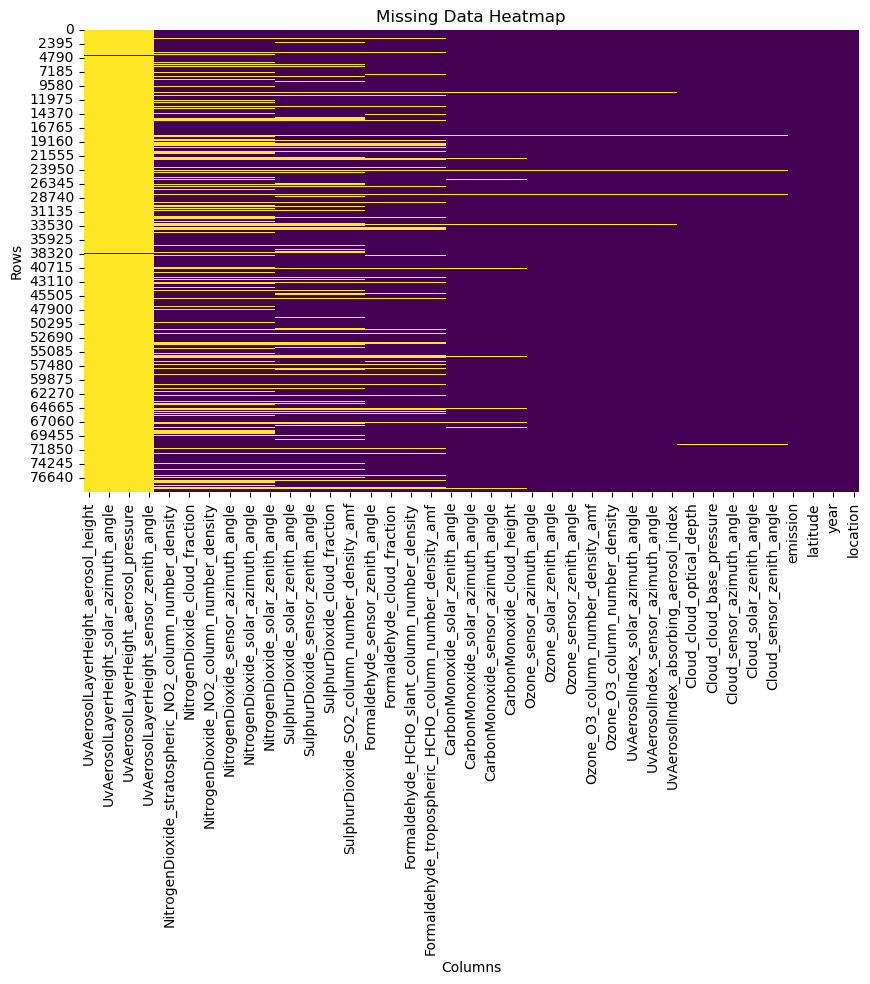

In [16]:
# Create a DataFrame with the missing value counts
missing_data = train.isnull().sum().sort_values(ascending=False)

# Create a heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(train[missing_data.index].isnull(), cmap='viridis', cbar=False)
plt.title('Missing Data Heatmap')
plt.xlabel('Columns')
plt.ylabel('Rows')

plt.show()

<AxesSubplot:>

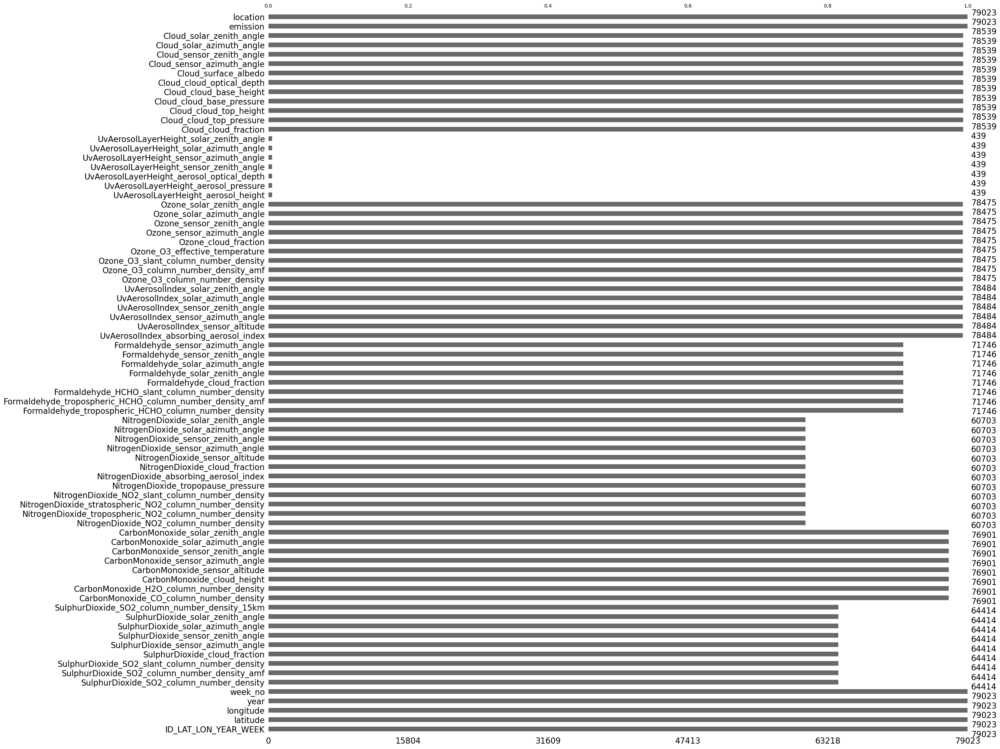

In [17]:
msno.bar(train)

<div class="alert alert-block alert-success">
    <b>Note:</b> 7 Features starting with naming convention  <b> "UvAerosolLayerHeight_" </b> has 99% missing. Next steps could be:
  <ul>
      <li> Create a feature noting % missing for each location for this group
      <li> Create boolean if missing or not
  </ul>
</div>

<div class="alert alert-block alert-success">
    <b>Note:</b> Multiple other features contain missing values which can be imputed. Next steps could be:
  <ul>
      <li> Set NaN values equal to 0
      <li> Set Nan values equal to mean/median per location or mean/median of all locations
  </ul>
</div>

### Dendrogram
The dendrogram uses a hierarchical clustering algorithm (courtesy of scipy) to bin variables against one another by their nullity correlation (measured in terms of binary distance). 
<br>
At each step of the tree the variables are split up based on which combination minimizes the distance of the remaining clusters. 
<br> 
The more monotone the set of variables, the closer their total distance is to zero, and the closer their average distance (the y-axis) is to zero.
<br> 
source: https://github.com/ResidentMario/missingno

<AxesSubplot:>

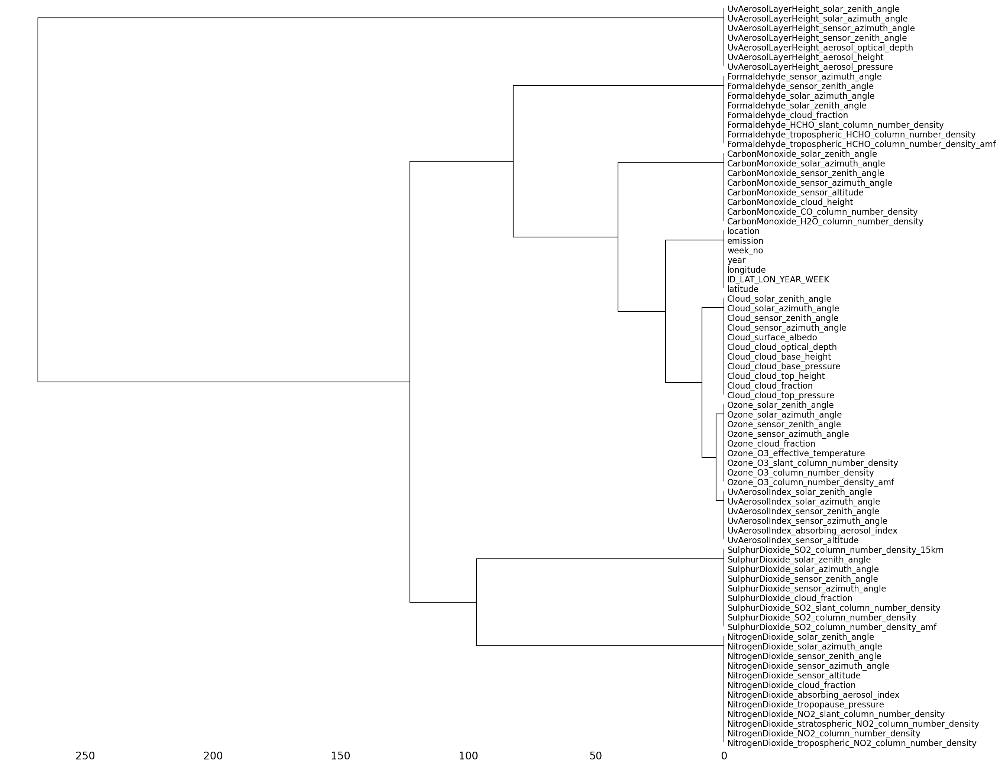

In [18]:
msno.dendrogram(train)

In [19]:
# Calculate missing percentage for each column
missing_percentage = (train.isnull().sum() / len(train)) * 100

# Create a DataFrame to display missing percentages
missing_df = pd.DataFrame({'Column': missing_percentage.index, 'Missing Percentage': missing_percentage.values})

# Sort by missing percentage in descending order
missing_df = missing_df.sort_values(by='Missing Percentage', ascending=False)

missing_df.reset_index()

,index,Column,Missing Percentage
0,57,UvAerosolLayerHeight_aerosol_height,99.44447
1,63,UvAerosolLayerHeight_solar_zenith_angle,99.44447
2,62,UvAerosolLayerHeight_solar_azimuth_angle,99.44447
3,61,UvAerosolLayerHeight_sensor_azimuth_angle,99.44447
4,58,UvAerosolLayerHeight_aerosol_pressure,99.44447
5,59,UvAerosolLayerHeight_aerosol_optical_depth,99.44447
6,60,UvAerosolLayerHeight_sensor_zenith_angle,99.44447
7,26,NitrogenDioxide_tropopause_pressure,23.18312
8,24,NitrogenDioxide_stratospheric_NO2_column_numbe...,23.18312
9,25,NitrogenDioxide_NO2_slant_column_number_density,23.18312


<a name="Preprocess"></a>
<div style="background-color: #80beff; border-radius: 10px; padding: 15px;">
  <h1 style="color: white; margin: 0; padding: 5px;">4. Preprocess </h1>
</div>

### - Sort Train/Test

In [20]:
train = train.sort_values(by = ['location', 'year', 'week_no'], ignore_index = True)
test = test.sort_values(by = ['location', 'year', 'week_no'], ignore_index = True)

### - Remove 2020 Data (COVID outlier data)

In [21]:
print('original df has rows:', len(train))
print('rows with year 2020 in it equals:', len(train[train['year'] == 2020]))
print('difference is:',  len(train)-len(train[train['year'] == 2020]))
# example
train[train['year'] == 2020].head(2)

original df has rows: 79023
rows with year 2020 in it equals: 26341
difference is: 52682


,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,...,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission,location
53,ID_-0.510_29.290_2020_00,-0.51000,29.29000,2020,0,0.00006,0.97029,0.00007,0.16346,-100.60266,...,60747.06353,4638.60218,6.28771,0.28312,-13.29138,33.67961,-140.30917,30.05345,3.75360,-0.51_29.29
54,ID_-0.510_29.290_2020_01,-0.51000,29.29000,2020,1,NaN,NaN,NaN,NaN,NaN,...,53750.17416,5361.48875,19.16727,0.31773,-30.47497,48.11975,-139.43778,30.39196,4.05197,-0.51_29.29


In [22]:
# Drop rows where year is equal to 2020
train = train[train['year'] != 2020]

# VALIDATION CHECK IF YEAR 2020 is dropped
print('after dropping COVID year 2020, df has length:', len(train))
print('unique years left in dataset are:')
print(*train['year'].unique(), sep='\n')

after dropping COVID year 2020, df has length: 52682
unique years left in dataset are:
2019
2021


<a name="Engineering"></a>
<div style="background-color: #20beff; border-radius: 10px; padding: 15px;">
  <h1 style="color: white; margin: 0; padding: 5px;">5. Feature engineering</h1>
</div>

### - <b> location </b>

In [23]:
train['location'] = [str(x) + '_' + str(y) for x, y in zip(train.latitude, train.longitude)]
test['location'] = [str(x) + '_' + str(y) for x, y in zip(test.latitude, test.longitude)]

###  - <b> data_percentage_feature </b>

In [24]:
def calculate_data_percentage(data, columns_to_check):
    # Filter locations that have at least one non-missing value (not NaN and not 0) in the specified columns
    # The ~ operator is used to invert the condition and select rows without missing values.
    filtered_data = data[~data[columns_to_check].isna().any(axis=1)]
    
    # Calculate the data percentage for each location
    data_percentage_by_location = (filtered_data.groupby('location').size() / len(filtered_data)) * 100
    
    # Create a new feature in the DataFrame
    data['data_percentage_feature'] = data['location'].map(data_percentage_by_location).fillna(0)
    
    return data

# Columns with high missing percentages
columns_to_check = ['UvAerosolLayerHeight_aerosol_height', 'UvAerosolLayerHeight_solar_zenith_angle',
                    'UvAerosolLayerHeight_solar_azimuth_angle', 'UvAerosolLayerHeight_sensor_azimuth_angle',
                    'UvAerosolLayerHeight_aerosol_pressure', 'UvAerosolLayerHeight_aerosol_optical_depth',
                    'UvAerosolLayerHeight_sensor_zenith_angle']

# Apply the function to the train dataset
train = calculate_data_percentage(train, columns_to_check)

# Apply the function to the test dataset
test = calculate_data_percentage(test, columns_to_check)

In [25]:
# TEST
print(f"{len(train['data_percentage_feature'].unique())} unique data percentages for UvAerosolLayerHeight_* variables")
print(sorted(train['data_percentage_feature'].unique()))
#train['data_percentage_feature'].head()

7 unique data percentages for UvAerosolLayerHeight_* variables
[0.0, 0.22779043280182232, 0.45558086560364464, 0.683371298405467, 0.9111617312072893, 1.1389521640091116, 1.366742596810934]


###  - <b> lat_bin </b>
###  - <b> lon_bin </b>
###  - <b> location_bin_grid </b>
###  - <b> location_bin_cluster </b>

In [26]:
import pandas as pd
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin
from category_encoders import BinaryEncoder
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans


# Custom Transformer to preprocess geolocations
class PreprocessGeolocations(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        lat_increment = 0.2
        lon_increment = 0.2
        X['lat_bin'] = (X['latitude'] // lat_increment).astype(int)
        X['lon_bin'] = (X['longitude'] // lon_increment).astype(int)
        X['location_bin_grid'] = X['lat_bin'].astype(str) + '_' + X['lon_bin'].astype(str)

        num_clusters = 100
        locations = X[['latitude', 'longitude']].values
        kmeans = KMeans(n_clusters=num_clusters, random_state=42)
        X['location_bin_cluster'] = kmeans.fit_predict(locations)

        return X

In [27]:
# Instantiate the PreprocessGeolocations transformer
geolocation_transformer = PreprocessGeolocations()

# Fit the transformer on the training data
geolocation_transformer.fit(train)

# Transform both the training and test data
train_transformed = geolocation_transformer.transform(train)
test_transformed = geolocation_transformer.transform(test)


### - <b> location_bin_grid_encoded </b>
- drop object column <b> ID_LAT_LON_YEAR_WEEK </b> and label encode <b> location_bin_grid </b> and drop original after having encoded column

In [28]:
from sklearn.preprocessing import LabelEncoder
def preprocess_data(data):
    # Instantiate the LabelEncoder
    label_encoder = LabelEncoder()

    # Check if the encoding and dropping have already been done
    if 'location_bin_grid_encoded' not in data.columns:
        # Fit and transform the 'location_bin_grid' feature
        data['location_bin_grid_encoded'] = label_encoder.fit_transform(data['location_bin_grid'])

    ##################### BACKFILL #####################
    # Grouped backfill imputation for train dataset
    data = data.groupby('location').fillna(method='bfill')
    
    ##################### Replace remaining NaN with 0 #####################
    # Fill any remaining null values in train_grouped with 0
    data.fillna(0, inplace=True)

    ##################### Check if columns need to be dropped #####################
    columns_to_drop = []
    if 'location_bin_grid' in data.columns:
        columns_to_drop.append('location_bin_grid')
    if 'ID_LAT_LON_YEAR_WEEK' in data.columns:
        columns_to_drop.append('ID_LAT_LON_YEAR_WEEK')
    if 'location' in data.columns:
        columns_to_drop.append('location')

    if columns_to_drop:
        data = data.drop(columns=columns_to_drop)
        print("Dropped columns:", columns_to_drop)
    else:
        print("Columns have already been dropped.")

    return data

# Apply the preprocessing function to train_transformed
train_transformed = preprocess_data(train_transformed)

# Apply the preprocessing function to test_transformed
test_transformed = preprocess_data(test_transformed)

Dropped columns: ['location_bin_grid', 'ID_LAT_LON_YEAR_WEEK']
Dropped columns: ['location_bin_grid', 'ID_LAT_LON_YEAR_WEEK']


In [29]:
train_transformed.head(2)

,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,SulphurDioxide_sensor_zenith_angle,...,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission,data_percentage_feature,lat_bin,lon_bin,location_bin_cluster,location_bin_grid_encoded
0,-0.51000,29.29000,2019,0,-0.00011,0.60302,-0.00007,0.25567,-98.59389,50.84356,...,-12.62899,35.63242,-138.78642,30.75214,3.75099,0.22779,-3,146,66,98
1,-0.51000,29.29000,2019,1,0.00002,0.72821,0.00001,0.13099,16.59286,39.13719,...,30.35938,39.55763,-145.18393,27.25178,4.02518,0.22779,-3,146,66,98


In [30]:
test_transformed.head(2)

,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,SulphurDioxide_sensor_zenith_angle,...,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,data_percentage_feature,lat_bin,lon_bin,location_bin_cluster,location_bin_grid_encoded
0,-0.51000,29.29000,2022,0,0.00046,0.69116,0.00032,0.00000,76.23920,15.60061,...,0.24077,-100.11379,33.69704,-133.04755,33.77958,0.19111,-3,146,36,98
1,-0.51000,29.29000,2022,1,0.00046,0.69116,0.00032,0.00000,76.23920,15.60061,...,0.29312,-30.51032,42.40259,-138.63282,31.01238,0.19111,-3,146,36,98


## Normalize [OPTIONAL]
note: normalizing with e.g. MinMaxscaler did not improve scoring results

In [ ]:
def normalize_data(data):
    # Instantiate the StandardScaler
    scaler = StandardScaler()

    # Fit and transform the data using the StandardScaler
    normalized_data_array = scaler.fit_transform(data)
    
    # Convert the normalized data array back to a DataFrame
    normalized_data_df = pd.DataFrame(normalized_data_array, columns=data.columns)

    return normalized_data_df

In [ ]:
# Normalize the train_grouped data
normalized_train = normalize_data(train_transformed)

# Normalize the test_grouped data
normalized_test = normalize_data(test_transformed)

In [ ]:
# TEST
normalized_train.head()

<a name="train_test_split"></a>
<div style="background-color: #12b000; border-radius: 10px; padding: 15px;">
  <h1 style="color: white; margin: 0; padding: 5px;">Train/Test Split</h1>
</div>

In [32]:
import xgboost as xgb
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import OneHotEncoder

# TEST -> skip normalizing, so use train_transformed instead
train = train_transformed # normalized_train

# Assume 'train_transformed' is your whole dataset
X = train.drop('emission', axis=1)  # Features
y = train['emission']  # Target

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

<a name="Feature_Importance"></a>
<div style="background-color: #00a391; border-radius: 10px; padding: 15px;">
  <h1 style="color: white; margin: 0; padding: 5px;">6. Feature Importance</h1>
</div>

### FEATURE IMPORTANCE - LIGHTGBM

In [33]:
import lightgbm as lgb
from sklearn.metrics import mean_squared_error

# Convert the data to LightGBM dataset format
train_data = lgb.Dataset(X_train, label=y_train)
test_data = lgb.Dataset(X_test, label=y_test, reference=train_data)

# Set LightGBM parameters
params = {
    'objective': 'regression',
    'metric': 'rmse',
    'boosting_type': 'gbdt',  # Gradient Boosting Decision Tree
    'num_leaves': 31,  # Maximum number of leaves in one tree
    'learning_rate': 0.05,
    'feature_fraction': 0.9,  # Proportion of features to consider in each iteration
    'bagging_fraction': 0.8,  # Proportion of training data to randomly sample
    'bagging_freq': 5,  # Frequency of bagging, 0 means no bagging
    'verbose': 0  # Set to 0 to suppress output 
}

# Train the LightGBM model
num_round = 100  # Number of boosting rounds (iterations)
bst = lgb.train(params, train_data, num_round, valid_sets=[test_data], early_stopping_rounds=100)

# Make predictions
y_pred = bst.predict(X_test, num_iteration=bst.best_iteration)

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("RMSE:", rmse)

# Feature importance
feature_importance = bst.feature_importance(importance_type='split')  # 'split' or 'gain'
feature_names = X.columns.tolist()
for feat, importance in zip(feature_names, feature_importance):
    print(f"Feature: {feat}, Importance: {importance}")

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.026010 seconds.
You can set `force_col_wise=true` to remove the overhead.
[1]	valid_0's rmse: 140.405
Training until validation scores don't improve for 100 rounds
[2]	valid_0's rmse: 134.8
[3]	valid_0's rmse: 129.516
[4]	valid_0's rmse: 124.582
[5]	valid_0's rmse: 120.271
[6]	valid_0's rmse: 116.012
[7]	valid_0's rmse: 111.835
[8]	valid_0's rmse: 108.006
[9]	valid_0's rmse: 104.381
[10]	valid_0's rmse: 100.953
[11]	valid_0's rmse: 97.73
[12]	valid_0's rmse: 94.8475
[13]	valid_0's rmse: 92.0129
[14]	valid_0's rmse: 89.2776
[15]	valid_0's rmse: 86.7332
[16]	valid_0's rmse: 84.3314
[17]	valid_0's rmse: 82.099
[18]	valid_0's rmse: 80.039
[19]	valid_0's rmse: 78.0738
[20]	valid_0's rmse: 76.1993
[21]	valid_0's rmse: 74.3144
[22]	valid_0's rmse: 72.5437
[23]	valid_0's rmse: 71.0008
[24]	valid_0's rmse: 69.5769
[25]	valid_0's rmse: 68.2654
[26]	valid_0's rmse: 66.9063
[27]	valid_0's rmse: 65.5406
[28]	

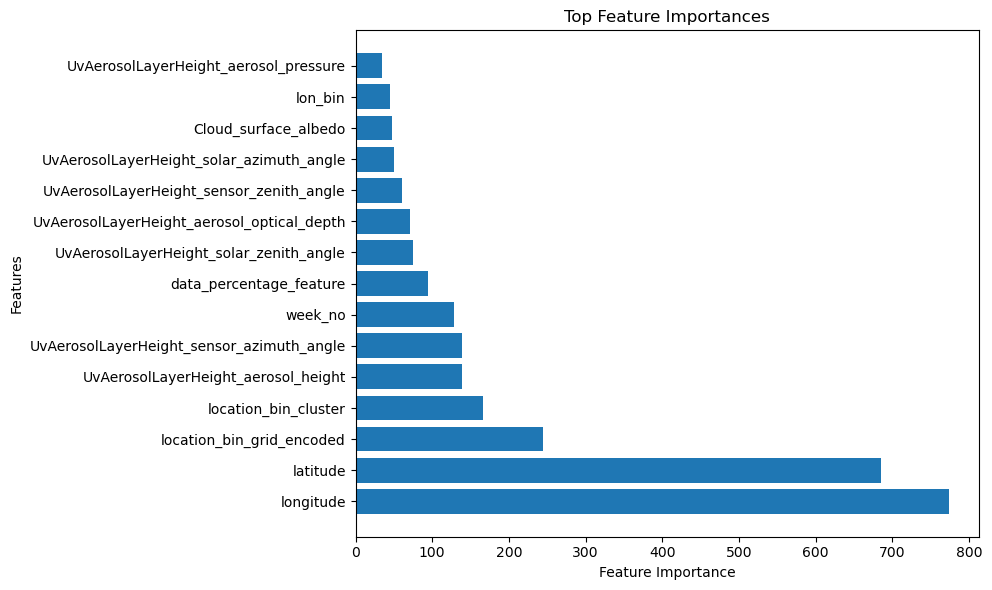

In [35]:
# Assuming you have already trained a LightGBM model named 'model'
model = bst
feature_importances = model.feature_importance()

# Get the feature names from your dataset
feature_names = X.columns

# Create a dictionary of feature names and their importance values
feature_importance_dict = dict(zip(feature_names, feature_importances))

# Sort the features by importance in descending order
sorted_features = sorted(feature_importance_dict.items(), key=lambda x: x[1], reverse=True)

# Extract top N important features
num_top_features = 15  # You can change this to the number of features you want to visualize
top_features = dict(sorted_features[:num_top_features])

# Plotting the feature importances
plt.figure(figsize=(10, 6))
plt.barh(range(len(top_features)), top_features.values(), align='center')
plt.yticks(range(len(top_features)), top_features.keys())
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('Top Feature Importances')
plt.tight_layout()
plt.show()

<a name="Modeling"></a>
<div style="background-color: #6A0DAD; border-radius: 10px; padding: 15px;">
  <h1 style="color: white; margin: 0; padding: 5px;">7.  Modeling</h1>
</div>

<a name="Baseline"></a>
<div class="alert alert-block alert-warning">
    <h2> BASELINE I: </h2>
    <h4> METHOD:  Taking yearly lag (53 week lag of 2021 data for week 0 through week 48)</h4> 
    <br> <b> Public Score: </b> RMSE: ~210 -> which is relative bad score to Leaderboard
</div>

In [ ]:
# Filter rows based on location, year, and week
filtered_df = train[(train['year'] == 2021) & (train['week_no'] <= 48)]

# Create a new DataFrame 'predict_df' containing lag values shifted by 53 weeks
predict_df = pd.DataFrame()
predict_df['lag_value_2021'] = filtered_df['emission']

# create a numpy array of the predictions
lst_predict = predict_df['lag_value_2021'].ravel()

# Create a DataFrame with 'ID_LAT_LON_YEAR_WEEK' and 'emission' columns
emission_df_2021_values = pd.DataFrame({
    'ID_LAT_LON_YEAR_WEEK': samplesubmission['ID_LAT_LON_YEAR_WEEK'],
    'emission': lst_predict
})

# Save the DataFrame to a CSV file
emission_df_2021_values.to_csv('emission_df_2021_values.csv', index=False)

<a name="XGBoost"></a>
<div class="alert alert-block alert-warning">
    <h2> XGBOOST </h2>
    <h4> METHOD: It is an ensemble learning method that combines the predictions of multiple weak learners (usually decision trees) to create a strong predictive model.</h4> 
    <br> <b> Public Score: </b> RMSE: ~177 -> which is relative bad score to Leaderboard
</div>

In [ ]:
import xgboost as xgb
import numpy as np
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import TimeSeriesSplit

# Assume 'train_transformed' is your whole dataset
X = train_transformed.drop('emission', axis=1)  # Features
y = train_transformed['emission']  # Target

# Set XGBoost parameters
params = {
    'objective': 'reg:squarederror',
    'random_state': 42,
    'eval_metric': 'rmse',
    'max_depth': 3, 
    'learning_rate': 0.008543738230367779
}

# Initialize a TimeSeriesSplit cross-validator
tscv = TimeSeriesSplit(n_splits=5)

# Lists to store RMSE scores for each fold
rmse_scores = []

# Perform time-based cross-validation
for train_index, test_index in tscv.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Convert the datasets to DMatrix format
    dtrain = xgb.DMatrix(data=X_train, label=y_train)
    dtest = xgb.DMatrix(data=X_test, label=y_test)

    # Train the XGBoost model
    model = xgb.train(params, dtrain, num_boost_round=100, verbose_eval=False)

    # Predictions for the current fold
    fold_predictions = model.predict(dtest)

    # Calculate RMSE for the current fold
    rmse = np.sqrt(mean_squared_error(y_test, fold_predictions))
    rmse_scores.append(rmse)

# Print RMSE scores for each fold
for fold, rmse in enumerate(rmse_scores):
    print(f"Fold {fold + 1} RMSE:", rmse)

In [ ]:
# Get feature importance scores
feature_importance = model.get_score(importance_type='gain')  # You can use 'weight', 'gain', or 'cover'

# Print feature importance scores
print("Feature Importance Scores:")
for feature, importance in feature_importance.items():
    print(f"{feature}: {importance}")

In [ ]:
feature_importance

In [ ]:
# predict
# Assume 'transformed_test' is your test dataset
X_test = test_transformed #.drop('emission', axis=1)  # Features
dtest = xgb.DMatrix(data=X_test)

# Predictions for the test data
test_predictions = model.predict(dtest)


In [ ]:
len(test_predictions)

In [ ]:
# Create a DataFrame with 'ID_LAT_LON_YEAR_WEEK' and 'emission' columns
xgboost_df = pd.DataFrame({
    'ID_LAT_LON_YEAR_WEEK': samplesubmission['ID_LAT_LON_YEAR_WEEK'],
    'emission': test_predictions
})

# Save the DataFrame to a CSV file
xgboost_df.to_csv('xgboost_df.csv', index=False)

<a name="Optuna"></a>
# GRID SEARCH (OPTUNA Package)
note: 496] Trial 1 finished with value: 145.47379419142618 and parameters: {'max_depth': 3, 'learning_rate': 0.008543738230367779}. Best is trial 1 with value: 145.47379419142618.

In [ ]:
import xgboost as xgb
import optuna
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error

# Define the objective function for Optuna
def objective(trial):
    # Define XGBoost parameters to search over
    params = {
        'objective': 'reg:squarederror',
        'random_state': 42,
        'eval_metric': 'rmse',
        #'n_estimators': trial.suggest_int('n_estimators', 50, 300),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.3),
        # Add other parameters you want to tune
    }

    # Initialize a TimeSeriesSplit cross-validator
    tscv = TimeSeriesSplit(n_splits=5)

    # Lists to store RMSE scores for each fold
    rmse_scores = []

    # Perform time-based cross-validation
    for train_index, test_index in tscv.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Convert the datasets to DMatrix format
        dtrain = xgb.DMatrix(data=X_train, label=y_train)
        dtest = xgb.DMatrix(data=X_test, label=y_test)

        # Train the XGBoost model
        model = xgb.train(params, dtrain, num_boost_round=100, verbose_eval=False)

        # Predictions for the current fold
        fold_predictions = model.predict(dtest)

        # Calculate RMSE for the current fold
        rmse = np.sqrt(mean_squared_error(y_test, fold_predictions))
        rmse_scores.append(rmse)

    # Calculate and return the average RMSE across folds
    return np.mean(rmse_scores)

# Create a Optuna study object
study = optuna.create_study(direction='minimize')

# Optimize the study
study.optimize(objective, n_trials=100)  # You can adjust the number of trials


In [ ]:
best_params = study.best_params
best_value = study.best_value

print("Best Parameters:", best_params)
print("Best RMSE:", best_value)

 - Emmissions have a cyclic pattern that we saw in the [EDA Notebook](https://www.kaggle.com/code/kenpachi99/hackathon-getting-started-eda) - This will be helpful to our model
 - With more research and domain knowledge generate useful features that can improve your model performance

 Other examples of feature engineering:
  - Creating cluster regions
  - Interactions between different pollutatnts - ratios, additions,subtractions...
  - Time series features

<a name="Prophet"></a>
<div class="alert alert-block alert-warning">
    <h2> Prophet: </h2>
    <h4> METHOD:  for each location create a seperate prediction and append predictions </h4> 
    <br> <b> Public Score: </b> RMSE: 33.78
</div>

### PIPELINE

In [ ]:
import pandas as pd
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin
from category_encoders import BinaryEncoder
from sklearn.impute import SimpleImputer

# Custom Transformer to sort DataFrame
class SortDataFrame(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X_sorted = X.sort_values(by=['location', 'year', 'week_no'], ignore_index=True)
        return X_sorted

# Custom Transformer to convert year and week_no to datetime
class ConvertToDate(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X['ds'] = pd.to_datetime(X.apply(lambda row: f"{row['year']} {row['week_no']} 0", axis=1), format="%Y %W %w")
        return X

# Custom Transformer to preprocess geolocations
class PreprocessGeolocations(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        lat_increment = 0.75
        lon_increment = 0.75
        X['lat_bin'] = (X['latitude'] // lat_increment).astype(int)
        X['lon_bin'] = (X['longitude'] // lon_increment).astype(int)
        X['location_bin_grid'] = X['lat_bin'].astype(str) + '_' + X['lon_bin'].astype(str)

        num_clusters = 60
        locations = X[['latitude', 'longitude']].values
        kmeans = KMeans(n_clusters=num_clusters, random_state=42)
        X['location_bin_cluster'] = kmeans.fit_predict(locations)

        return X

# Custom Transformer to binary encode location_bin_grid column
class EncodeLocationBin(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        encoder = BinaryEncoder(cols=['location_bin_grid'], drop_invariant=True)  # Added drop_invariant
        X_encoded = encoder.fit_transform(X)  # Apply encoding to the entire DataFrame
        return X_encoded

# Custom Transformer to remove features with high missing values
class RemoveHighMissing(BaseEstimator, TransformerMixin):
    def __init__(self, threshold=0.8):
        self.threshold = threshold

    def fit(self, X, y=None):
        self.columns_to_drop = X.columns[X.isnull().mean() > self.threshold]
        return self

    def transform(self, X):
        X_filtered = X.drop(columns=self.columns_to_drop)
        return X_filtered

# Define the pipeline
pipeline = Pipeline([
    #('sort_dataframe', SortDataFrame()),  # Sort DataFrame as the first step
    ('convert_to_date', ConvertToDate()),
    ('preprocess_geolocations', PreprocessGeolocations()),
    #('remove_high_missing', RemoveHighMissing()),
    ('encode_location_bin', EncodeLocationBin())
])


Add back 'location' feature

In [ ]:
# Add Unique ID for each location / timeseries dataset
train_transformed['location'] = [str(x) + '_' + str(y) for x, y in zip(train_transformed.latitude, train_transformed.longitude)]
test_transformed['location'] = [str(x) + '_' + str(y) for x, y in zip(test_transformed.latitude, test_transformed.longitude)]

### Apply Pipeline to Train/Test Sets

#### TRAIN

In [ ]:
# Fit the pipeline on the training data
pipeline.fit(train_transformed)

# Apply the fitted pipeline to the DataFrame
transformed_df = pipeline.transform(train_transformed)

# Backfill missing values in the transformed DataFrame
transformed_df.fillna(method='backfill', inplace=True)

# Only set 'ds' column as the index if it's not already the index
if 'ds' in transformed_df.columns:
    transformed_df = transformed_df.set_index('ds')

# Extract the 'emission' column and move it to index 0
if transformed_df.columns[0] != 'emission':
    emission_column = transformed_df['emission']
    transformed_df.drop('emission', axis=1, inplace=True)  # Remove the 'emission' column from the DataFrame
    transformed_df.insert(0, 'emission', emission_column)  # Insert the 'emission' column at index 0


# Sort Dataframe - already sorted?
#transformed_df.sort_values(by = ['location', 'year', 'week_no'], ignore_index = True)

#### TEST

In [ ]:
# Fit the pipeline on the training data
pipeline.fit(test_transformed)

# Apply the fitted pipeline to the DataFrame
transformed_df_test = pipeline.transform(test_transformed)

# Backfill missing values in the transformed DataFrame
transformed_df_test.fillna(method='backfill', inplace=True)

transformed_df_test['location'] = [str(x) + '_' + str(y) for x, y in zip(transformed_df_test.latitude, transformed_df_test.longitude)]

# Only set 'ds' column as the index if it's not already the index
if 'ds' in transformed_df_test.columns:
    transformed_df_test = transformed_df_test.set_index('ds')

#######   
lat_increment = 0.2
lon_increment = 0.2
transformed_df_test['lat_bin'] = (transformed_df_test['latitude'] // lat_increment).astype(int)
transformed_df_test['lon_bin'] = (transformed_df_test['longitude'] // lon_increment).astype(int)
transformed_df_test['location_bin_grid'] = transformed_df_test['lat_bin'].astype(str) + '_' + transformed_df_test['lon_bin'].astype(str)

transformed_df_test = preprocess_data(transformed_df_test)    
    
####### ADD FEATURE: data_percentage_feature #######
# Columns with high missing percentages
columns_to_check = ['UvAerosolLayerHeight_aerosol_height', 'UvAerosolLayerHeight_solar_zenith_angle',
                    'UvAerosolLayerHeight_solar_azimuth_angle', 'UvAerosolLayerHeight_sensor_azimuth_angle',
                    'UvAerosolLayerHeight_aerosol_pressure', 'UvAerosolLayerHeight_aerosol_optical_depth',
                    'UvAerosolLayerHeight_sensor_zenith_angle']


# add 
transformed_df_test['location'] = [str(x) + '_' + str(y) for x, y in zip(transformed_df_test.latitude, transformed_df_test.longitude)]
transformed_df_test = calculate_data_percentage(transformed_df_test, columns_to_check)
    
# Sort Dataframe - already sorted?
#transformed_df.sort_values(by = ['location', 'year', 'week_no'], ignore_index = True)

In [ ]:
transformed_df_test.head(2)

### PCA

In [ ]:
# FUNCTION
def perform_pca(X_train, num_features_pca):
    # Exclude non-numeric columns from X_train
    numeric_columns = X_train.select_dtypes(include=['number']).columns
    X_numeric = X_train[numeric_columns]

    # Normalize the features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_numeric)

    pca = PCA(n_components=num_features_pca)
    pca.fit(X_scaled)

    feature_names = X_numeric.columns
    sorted_idx = np.argsort(pca.explained_variance_ratio_)[::-1]
    sorted_features = feature_names[sorted_idx]
    selected_cols_pca = sorted_features.tolist()

    return sorted_features, pca, sorted_idx, selected_cols_pca

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

#################################
# PCA
#################################
# Exclude 'emission' column before running PCA
X_train_pca = train_transformed.copy(deep=True)
X_train_pca = X_train_pca.drop(columns=['emission'])

# retrieve the features to keep
num_features_pca = 60 #-> IMPORTANT TO SET THIS
sorted_features, pca, sorted_idx, selected_cols_pca = perform_pca(X_train_pca, num_features_pca)

# Insert 'emission' column at index 0 and assign the modified list to lst_pca
selected_cols_pca.insert(0, 'emission')

# Additional columns to add
additional_cols = [
    'location_bin_cluster',
    'location_bin_grid_encoded',
    'data_percentage_feature'
]

# Add the additional columns to the list
selected_cols_pca.extend(additional_cols)

# Create a copy of the modified list
lst_pca = selected_cols_pca.copy()

In [ ]:
def perform_train_test_split(df, my_insample_forecast_steps, scaler_choice=None, numerical_features=[]):
    """
    Splits a given dataset into training and testing sets based on a user-specified test-set size.

    Args:
        df (pandas.DataFrame): A Pandas DataFrame containing the dataset to be split.
        my_insample_forecast_steps (int): An integer representing the number of rows to allocate for the test-set.
        scaler_choice (str): A string representing the type of scaler to be used. The default is None, which means no
        scaling is performed.
        numerical_features (list): A list of column names representing the numerical features to be scaled.

    Returns:
        tuple: A tuple containing the training and testing sets for both the features (X) and target variable (y),
            as well as the index of the split.

    Raises:
        ValueError: If the specified test-set size is greater than or equal to the total number of rows in the dataset.
    """

    # Initialize X_train_numeric_scaled with a default value
    X_train_numeric_scaled = pd.DataFrame() # TEST
    X_test_numeric_scaled = pd.DataFrame() # TEST
    X_numeric_scaled = pd.DataFrame() # TEST

    # Split the data into training and testing sets
    X = df.iloc[:, [0, 2] + list(range(3, df.shape[1]))]
    y = df.iloc[:, 0:2]

    X_train = X.iloc[:-my_insample_forecast_steps, :]
    X_test = X.iloc[-my_insample_forecast_steps:, :]
    y_train = y.iloc[:-my_insample_forecast_steps, :]
    y_test = y.iloc[-my_insample_forecast_steps:, :]

    # initialize variable
    scaler = ""

    # Scale the data if user selected a scaler choice in the normalization / standardization in streamlit sidebar
    if scaler_choice != "None":
        # check if there are numerical features in dataframe, if so run code
        if numerical_features:
            # Select only the numerical features to be scaled
            X_train_numeric = X_train[numerical_features]
            X_test_numeric = X_test[numerical_features]
            X_numeric = X[numerical_features]

            # Create the scaler based on the selected choice
            scaler_choices = {
                                "MinMaxScaler": MinMaxScaler(),
                                "RobustScaler": RobustScaler(),
                                "MaxAbsScaler": MaxAbsScaler(),
                                "PowerTransformer": PowerTransformer(),
                                "QuantileTransformer": QuantileTransformer(n_quantiles=100, output_distribution="normal")
                             }

            if scaler_choice not in scaler_choices:
                           raise ValueError("Invalid scaler choice. Please choose from: MinMaxScaler, RobustScaler, MaxAbsScaler, "
                                            "PowerTransformer, QuantileTransformer")

            scaler = scaler_choices[scaler_choice]

            # Fit the scaler on the training set and transform both the training and test sets
            X_train_numeric_scaled = scaler.fit_transform(X_train_numeric)
            X_train_numeric_scaled = pd.DataFrame(X_train_numeric_scaled, columns=X_train_numeric.columns, index=X_train_numeric.index)

            # Store the feature names used for fitting the scaler
            scaler_features = X_train_numeric_scaled.columns.tolist()
            print('scaler_features:', scaler_features) # TEST

            # note: you do not want to fit_transform on the test set else the distribution of the entire dataset is used and is data leakage
            X_test_numeric_scaled = scaler.transform(X_test_numeric)
            X_test_numeric_scaled = pd.DataFrame(X_test_numeric_scaled, columns=X_test_numeric.columns, index=X_test_numeric.index)

            # refit the scaler on the entire exogenous features e.g. X which is used for forecasting beyond train/test sets
            X_numeric_scaled = scaler.fit_transform(X_numeric)

            # Convert the scaled array back to a DataFrame and set the column names
            X_numeric_scaled = pd.DataFrame(X_numeric_scaled, columns=X_numeric.columns, index=X_numeric.index)

    # Replace the original
    if scaler_choice != "None":
        X_train[numerical_features] = X_train_numeric_scaled[numerical_features]
        X_test[numerical_features] = X_test_numeric_scaled[numerical_features]
        X[numerical_features] = X_numeric_scaled[numerical_features]

    # Return the training and testing sets as well as the scaler used (if any)
    return X, y, X_train, X_test, y_train, y_test, scaler, scaler_features

In [ ]:
def preprocess_X_prophet(X):
    """
    Preprocess the X dataframe for Prophet modeling.

    Args:
        X (pd.DataFrame): Dataset with date index and independent features.

    Returns:
        pd.DataFrame: Preprocessed X dataframe with 'ds' column and regressor columns.
    """
    if isinstance(X.index, pd.DatetimeIndex):
        X = X.reset_index()

    X_prophet = X.copy()
    X_prophet = X_prophet.rename(columns={X_prophet.columns[0]: 'ds'})
    return X_prophet

def preprocess_data_prophet(y_data):
    """
    Preprocess the given data for Prophet model
    """
    # create a deep copy of dataframe e.g. completely new copy of the DataFrame is created with its own memory space
    # This means that any changes made to the new copy will not affect the original DataFrame.
    y_data_prophet = y_data.copy(deep=True)

    # Check if the index is already a datetime index and revert it to a column if needed
    if isinstance(y_data_prophet.index, pd.DatetimeIndex):
        y_data_prophet.reset_index(inplace=True)

    # REQUIREMENT PROPHET: CREATE DATAFRAME WITH DATE COLUMN 'DS' AND 'Y' column
    y_data_prophet = pd.DataFrame({"ds": y_data_prophet.iloc[:, 0], "y": y_data_prophet.iloc[:, 1]})
    return y_data_prophet

In [ ]:
##################################
# Create an empty DataFrame to store 
# the forecast results of each location
##################################
all_forecasts_df = pd.DataFrame()
forecast_df = pd.DataFrame()

##################################
## ONLY KEEP RELEVANT FEATURES
## retrieved from PCA analysis
##################################
lst_pca_test = list(lst_pca)
if 'emission' in lst_pca_test:
    lst_pca_test.remove('emission')

df_prophet_all_locations_test = transformed_df_test[lst_pca_test].copy(deep=True)

if 'ID_LAT_LON_YEAR_WEEK' in df_prophet_all_locations_test.columns:
    column_to_drop = 'ID_LAT_LON_YEAR_WEEK'
    df_prophet_all_locations_test.drop(columns=[column_to_drop], inplace=True)
else:
    print("'ID_LAT_LON_YEAR_WEEK' column already dropped")

# add location needed to loop over all the locations    
df_prophet_all_locations_test['location'] = [str(x) + '_' + str(y) for x, y in zip(df_prophet_all_locations_test.latitude, df_prophet_all_locations_test.longitude)]

##################################
## APPLY TO TRAIN SET
##################################
# Create a new DataFrame with selected columns from PCA -> needed for training
df_prophet_all_locations = transformed_df[lst_pca].copy(deep=True)
#df_prophet_all_locations.insert(1, 'y', train['emission'])
df_prophet_all_locations['location'] = [str(x) + '_' + str(y) for x, y in zip(df_prophet_all_locations.latitude, df_prophet_all_locations.longitude)]

#################################
# LOOP OVER EACH LOCATION
#################################
for idx, location in enumerate(df_prophet_all_locations_test['location'].unique()):
    print(f"index:{idx}, location: {location}")
    
    # Create an empty DataFrame to store the prediction results
    all_predictions_df = pd.DataFrame()
    rmse_df = pd.DataFrame(columns=['Location', 'RMSE'])

    # filter on single location the dataframe (e.g. 497 locations/dataframes total to iterate over)
    df_single_location = df_prophet_all_locations[df_prophet_all_locations['location'] == location]
    df_single_location = df_single_location.drop(['location'], axis = 1).fillna(0)
    # Check if 'ds' column is already in the DataFrame
    if 'ds' in df_single_location.columns:
        # 'ds' column is already present, no need to move it
        pass
    else:
        # Reset the index of df_single_location and move 'ds' column to index 0
        df_single_location = df_single_location.reset_index()
        df_single_location.insert(0, 'ds', df_single_location.pop('ds'))
        
    ##################################
    # NORMALIZE
    ##################################
    my_numerical_features = list(df_single_location.iloc[:, 2:].select_dtypes(include=['float', 'int']).columns)

    # exclusion list - don't normalize these!
    items_to_drop = ['latitude', 'longitude', 'year', 'week_no', 'location_bin_grid_0', 'location_bin_grid_1',
                  'location_bin_grid_2', 'location_bin_grid_3', 'location_bin_grid_4', 'location_bin_cluster', ]

    my_numerical_features = list(set(my_numerical_features) - set(items_to_drop))
    normalization_choice = 'MinMaxScaler'
    
    ##################################
    # TRAIN/TEST SPLIT
    ##################################
    # 53 weeks forecast
    my_insample_forecast_steps = 5

    # Train/Test Split
    X, y, X_train, X_test, y_train, y_test, scaler, scaler_features = perform_train_test_split(df = df_single_location,
                                                                                               my_insample_forecast_steps = my_insample_forecast_steps,
                                                                                               scaler_choice = normalization_choice,     
                                                                                               numerical_features = my_numerical_features)
    ##################################                                                                                     
    # TRAIN DATA PER LOCATION
    ##################################                                                                                           
    X_train_prophet = preprocess_X_prophet(X_train)
    X_train_prophet['ds'] = pd.to_datetime(X_train_prophet.apply(lambda row: f"{int(row['year'])} {int(row['week_no'])} 0", axis=1), format="%Y %W %w")
    y_train_prophet = preprocess_data_prophet(y_train)
    y_train_prophet['ds'] = X_train_prophet['ds']
    joined_train_data = pd.merge(y_train_prophet, X_train_prophet, on='ds')

    ##################################                                                                                           
    # TEST DATA PER LOCATION
    ##################################                                                                                           
    X_test_prophet = preprocess_X_prophet(X_test)
    y_test_prophet = preprocess_data_prophet(y_test)
    joined_test_data = pd.merge(y_test_prophet, X_test_prophet, on = 'ds')
    joined_test_data['ds'] = pd.to_datetime(joined_test_data.apply(lambda row: f"{int(row['year'])} {int(row['week_no'])} 0", axis=1), format="%Y %W %w")
    
    ##################################                                                                                           
    # MERGE TRAIN/TEST DATA
    ##################################                                                                                           
    merged_data = joined_train_data.append(joined_test_data, ignore_index = True)
    
    ##################################
    # Define Prophet Model Parameters
    ##################################
    my_conf_interval = 80
    my_interval_width = int(my_conf_interval/100)
    changepoint_prior_scale = 0.1 # changed from 0.01 to 0.1
    seasonality_mode = "additive" #additive #multiplicative
    seasonality_prior_scale = 0.01
    holidays_prior_scale = 0.01
    yearly_seasonality = True
    weekly_seasonality = True
    daily_seasonality = True
    interval_width = my_interval_width

    ##################################
    # Define Prophet Model
    ##################################
    m = Prophet(changepoint_prior_scale= changepoint_prior_scale,
              seasonality_mode = seasonality_mode,
              seasonality_prior_scale = seasonality_prior_scale,
              holidays_prior_scale = holidays_prior_scale,
              yearly_seasonality = yearly_seasonality,
              weekly_seasonality = weekly_seasonality,
              daily_seasonality = daily_seasonality,
              interval_width = interval_width)
    
    ##################################
    # Add independent features/regressors to Prophet model
    ##################################
    # iterate over the names of features found from training dataset (X_train) and add them to prophet model as regressors
    for column in X_train.columns:
        if column != 'ds':
            m.add_regressor(column)
            
    ##################################
    # Train the model
    ##################################
    # train the model on the data with set parameters
    m.fit(joined_train_data)

    ##################################
    # DEFINE TEST DATA OF LOCATION
    ##################################
    # Filter on single location the dataframe (e.g. 497 locations/dataframes total to iterate over)
    df_single_location_test = df_prophet_all_locations_test[df_prophet_all_locations_test['location'] == location]
    # Once you have a single location you can drop the location 
    df_single_location_test = df_single_location_test.drop(['location'], axis = 1).fillna(0)

    ##################################
    # NORMALIZE NUMERICAL FEATURES
    ##################################
    my_numerical_features_test = list(df_single_location_test.iloc[:, 2:].select_dtypes(include=['float', 'int']).columns)

    ##################################
    # Exclusion list 
    # e.g. don't normalize these!
    ##################################
    items_to_drop = ['latitude', 'longitude', 'year', 'week_no', 'location_bin_grid_0', 'location_bin_grid_1','location_bin_grid_2', 'location_bin_grid_3', 'location_bin_grid_4', 'location_bin_cluster', ]
    
    my_numerical_features_test = list(set(my_numerical_features_test) - set(items_to_drop))
    scaler_features_test = scaler_features

    ##################################
    ### NORMALIZE (e.g. min max data)
    ##################################
    # Transform the test set using the same scaler fitted on the training set
    X_test_numeric = df_single_location_test[scaler_features_test]
    X_test_numeric_scaled = scaler.transform(X_test_numeric) # scale with transformer trained on training set
    X_test_numeric_scaled = pd.DataFrame(X_test_numeric_scaled, columns=X_test_numeric.columns, index=X_test_numeric.index)

    ##################################
    # Create Dataframe with original columns 
    # not needed to be scaled + scaled columns 
    ##################################
    df_single_location_test_modified = df_single_location_test.copy()
    df_single_location_test_modified[my_numerical_features_test] = X_test_numeric_scaled

    ##################################
    # get 'ds' column back out of index
    ##################################
    df_single_location_test_modified = df_single_location_test_modified.reset_index()

    ##################################
    # Recreate column for id again
    ##################################
    df_single_location_test_modified['ID_LAT_LON_YEAR_WEEK'] = (
      'ID_' +
      df_single_location_test_modified['latitude'].apply(lambda x: f'{x:.3f}') +
      '_' +
      df_single_location_test_modified['longitude'].apply(lambda x: f'{x:.3f}') +
      '_' +
      df_single_location_test_modified['year'].astype(int).astype(str) +
      '_' +
      df_single_location_test_modified['week_no'].apply(lambda x: f"{x:02d}")
    )

    ##################################
    # Forecast
    ##################################
    forecast_test = m.predict(df_single_location_test_modified)

    ##################################
    # Post-process
    ##################################
    # add the ID for each location back to the forecast dataframe
    forecast_test['ID_LAT_LON_YEAR_WEEK'] = df_single_location_test_modified['ID_LAT_LON_YEAR_WEEK']
    forecast_df['ID_LAT_LON_YEAR_WEEK'] = df_single_location_test_modified['ID_LAT_LON_YEAR_WEEK']
    forecast_df['emission'] = forecast_test['yhat']

    ##################################
    # Only save ID and prediction to dataframe
    ##################################
    # Append the forecast_df to all_forecasts_df
    all_forecasts_df = all_forecasts_df.append(forecast_df, ignore_index=True)  # Assign back to all_forecasts_df
    
##################################
# Remove negative values and set equal to zero - e.g. no negative emission possible
##################################
all_forecasts_df['emission'] = all_forecasts_df['emission'].apply(lambda x: max(x, 0))

##################################
# step 9: Save Dataframe
##################################
path_to_save = 'all_forecasts_df_prophet.csv'
all_forecasts_df.to_csv(path_to_save, index=False)

##################################
# step 10: upload to kaggle / submission
##################################
# https://www.kaggle.com/competitions/playground-series-s3e20/overview/evaluation

<a name="Plot"></a>
# Plot Original + Prediction

**Original**

In [17]:
def transform(X):
    X['ds'] = pd.to_datetime(X.apply(lambda row: f"{row['year']} {row['week_no']} 0", axis=1), format="%Y %W %w")
    return X

# Apply the transformation to your DataFrame
transformed_train = transform(train.copy())

# Group data by location and date, and aggregate emissions
aggregated_data = transformed_train.groupby(['location', 'ds'])['emission'].mean().reset_index()

# Create a Plotly line plot
fig = px.line(aggregated_data, x='ds', y='emission', color='location',
              title='Emission Values Over Time by Location',
              labels={'ds': 'Date', 'emission': 'Emission'})

# Show the plot
fig.show()

**Prediction Preprocess for plotting**

In [47]:
df = pd.read_csv('/kaggle/input/co2-emission/all_forecasts_df(4)_x107.csv')

# Extracting year and week_no as integers
df['year'] = df['ID_LAT_LON_YEAR_WEEK'].str.extract('(\d{4})')
df['week_no'] = df['ID_LAT_LON_YEAR_WEEK'].str.extract('_(\d{2})$').astype(int)

df_transformed = transform(df)

# Extracting location from the ID column using regex
location_matches = df_transformed['ID_LAT_LON_YEAR_WEEK'].str.extract(r'ID_(-?\d+\.\d{3}_\d+\.\d{3})')
df_transformed['location'] = location_matches
df_transformed.head(1)

,ID_LAT_LON_YEAR_WEEK,emission,year,week_no,ds,location
0,ID_-0.510_29.290_2022_00,4.30187,2022,0,2022-01-02,-0.510_29.290


In [53]:
import plotly.graph_objects as go  # Import the go module

# Create Plotly line plots for actual data
fig = px.line(aggregated_data, x='ds', y='emission', color='location',
              title='Emission Values Over Time by Location',
              labels={'ds': 'Date', 'emission': 'Emission'},
              line_dash_sequence=['solid'],  # Solid line for actual data
              hover_data=['location'])  # Add location to hover info

# Adding forecast data with dotted lines
for location in df_transformed['location'].unique():
    forecast_trace = df_transformed[df_transformed['location'] == location]
    fig.add_trace(go.Scatter(x=forecast_trace['ds'], y=forecast_trace['emission'],
                             mode='lines', line=dict(dash='dashdot'),
                             name=location, hoverinfo='name+y'))

# Show the plot
fig.show()

<div class="alert alert-block alert-success">
    <b>Note:</b> Two forecasts of high emission areas seem to have higher variance probably resulting in larger error / RMSE -> let's forecast those again seperately
  <ul>
      <li> -2.378_29.222
      <li> -2.079_29.321
  </ul>
</div>

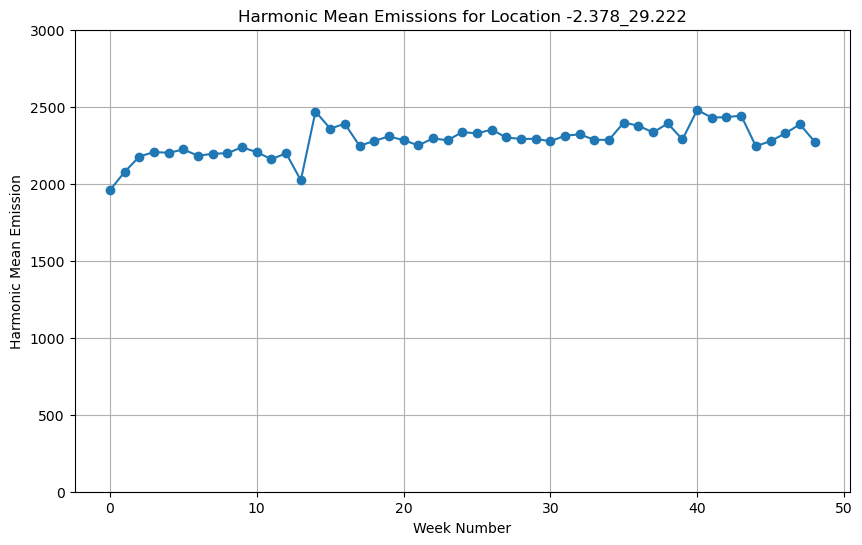

    week_no  harmonic_mean_emission
0         0              1958.09960
1         1              2077.22580
2         2              2176.46750
3         3              2205.93600
4         4              2200.71530
5         5              2222.25050
6         6              2181.90200
7         7              2194.24800
8         8              2198.57640
9         9              2237.00730
10       10              2204.41550
11       11              2159.71400
12       12              2197.39280
13       13              2022.20260
14       14              2468.57540
15       15              2358.20950
16       16              2389.02120
17       17              2246.27150
18       18              2277.59230
19       19              2307.46880
20       20              2282.73800
21       21              2249.13130
22       22              2294.30350
23       23              2282.06700
24       24              2334.98950
25       25              2327.39300
26       26              235

In [76]:
#my_location = '-2.378_29.222'
#train[train['location'] == my_location][['year', 'week_no', 'emission']]
from scipy.stats import hmean

# Define the location you're interested in
my_location = '-2.378_29.222'

# Filter the data for the specified location and years
filtered_data = train[train['location'] == my_location]

# Filter for the years 2019 and 2022
years = [2019, 2022]
filtered_data = filtered_data[filtered_data['year'].isin(years)]

# Group by week_no and year, and calculate harmonic mean
harmonic_means = filtered_data.groupby(['week_no'])['emission'].apply(hmean).reset_index()

# Rename the column for clarity
harmonic_means.rename(columns={'emission': 'harmonic_mean_emission'}, inplace=True)
harmonic_means = harmonic_means[harmonic_means['week_no'] <= 48]


plt.figure(figsize=(10, 6))
plt.plot(harmonic_means['week_no'], harmonic_means['harmonic_mean_emission'], marker='o')
plt.title(f'Harmonic Mean Emissions for Location {my_location}')
plt.xlabel('Week Number')
plt.ylabel('Harmonic Mean Emission')
plt.ylim(0, 3000)  # Set y-axis limits
#plt.xlim(0, 48)    # Set x-axis limits up to week 48
plt.grid(True)
plt.show()

# Print the harmonic means for each week
print(harmonic_means)

## 2nd location want to do the same with harmonic mean replacement

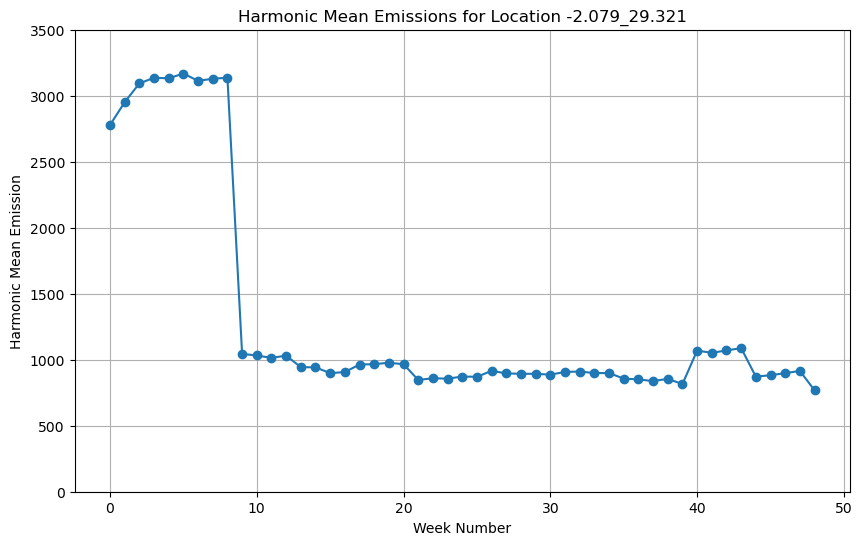

    week_no  harmonic_mean_emission
0         0              2778.19200
1         1              2950.95070
2         2              3093.17400
3         3              3136.04880
4         4              3131.84890
5         5              3167.76800
6         6              3112.76440
7         7              3128.44140
8         8              3136.65600
9         9              1044.48450
10       10              1031.98860
11       11              1013.88750
12       12              1031.12040
13       13               943.47770
14       14               942.62340
15       15               898.09680
16       16               906.81970
17       17               963.64514
18       18               966.26040
19       19               977.10920
20       20               965.85675
21       21               846.65180
22       22               859.83563
23       23               856.23004
24       24               872.77350
25       25               870.48800
26       26               91

In [97]:
from scipy.stats import hmean

# Define the location you're interested in
my_location = '-2.079_29.321'

# Filter the data for the specified location and years
filtered_data = train[train['location'] == my_location]

# Filter for the years 2019 and 2022
years = [2019, 2022]
filtered_data = filtered_data[filtered_data['year'].isin(years)]

# Group by week_no and year, and calculate harmonic mean
harmonic_means = filtered_data.groupby(['week_no'])['emission'].apply(hmean).reset_index()

# Rename the column for clarity
harmonic_means.rename(columns={'emission': 'harmonic_mean_emission'}, inplace=True)
harmonic_means = harmonic_means[harmonic_means['week_no'] <= 48]

plt.figure(figsize=(10, 6))
plt.plot(harmonic_means['week_no'], harmonic_means['harmonic_mean_emission'], marker='o')
plt.title(f'Harmonic Mean Emissions for Location {my_location}')
plt.xlabel('Week Number')
plt.ylabel('Harmonic Mean Emission')
plt.ylim(0, 3500)  # Set y-axis limits
#plt.xlim(0, 48)    # Set x-axis limits up to week 48
plt.grid(True)
plt.show()

# Print the harmonic means for each week
print(harmonic_means)

<div class="alert alert-block alert-success">
    <b>Note:</b> Taking the harmonic mean for two high emission locations <b> did not improve </b> results e.g. had a higher RMSE / Leaderboard Score by a couple points.
  <ul>
      <li> -2.378_29.222
      <li> -2.079_29.321
  </ul>
</div>